# **Pixel Transformation**
### Note: Just mention grayscale image

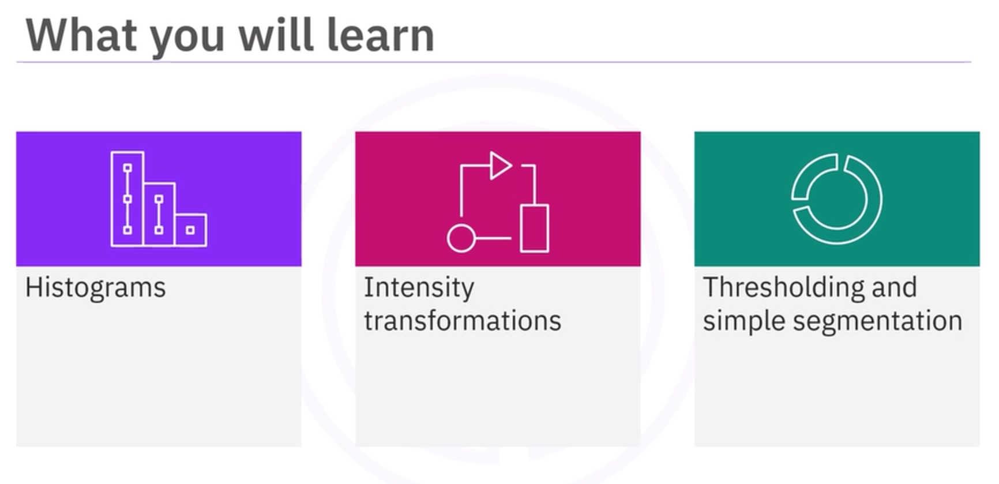

## **I./ Histograms**
#### **Definition:** a histogram counts the number of occurrences of a pixel, and it's a useful tool for understanding and maniputing images.

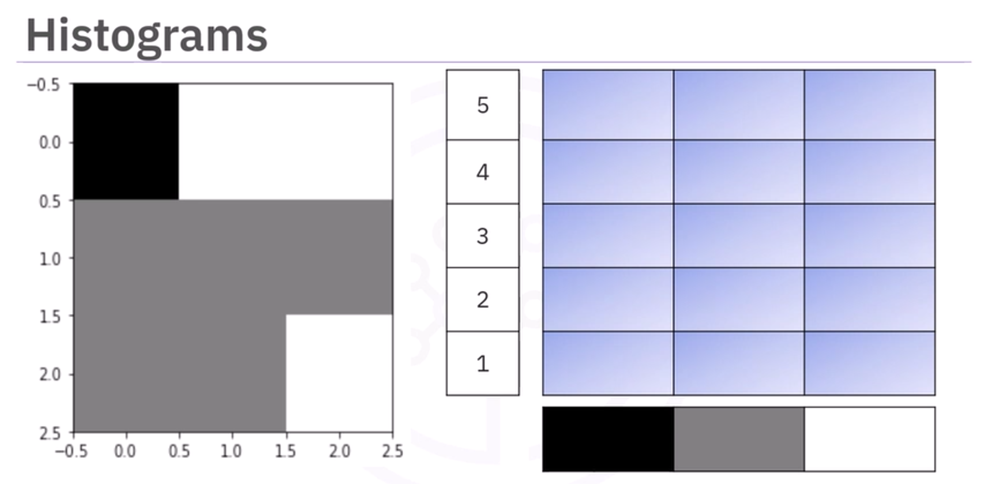
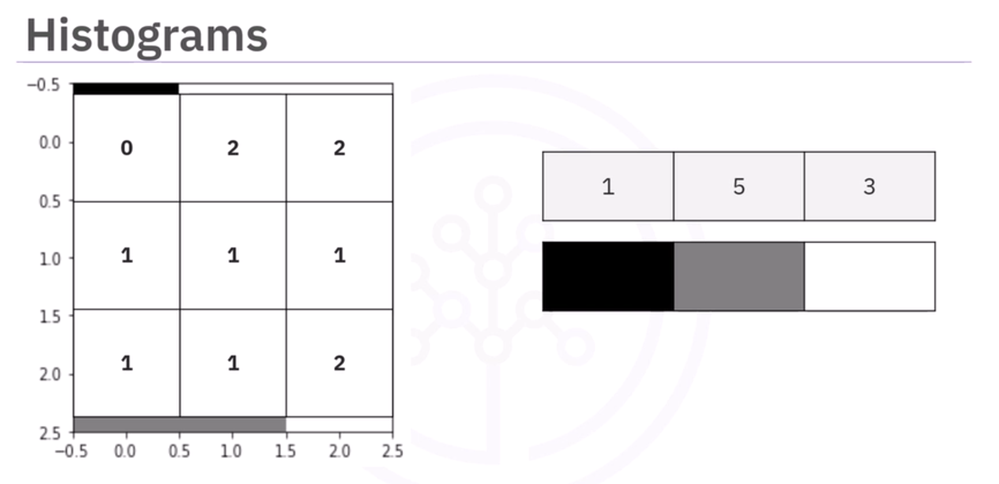
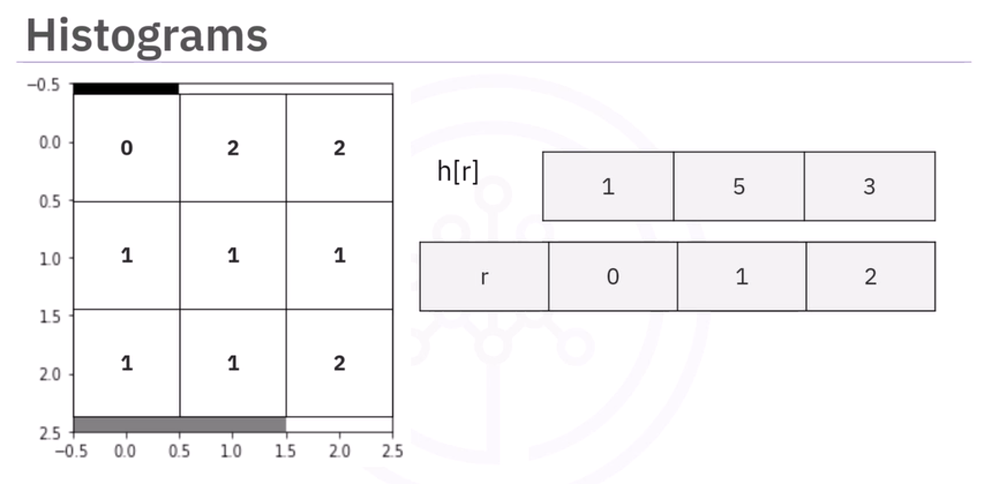
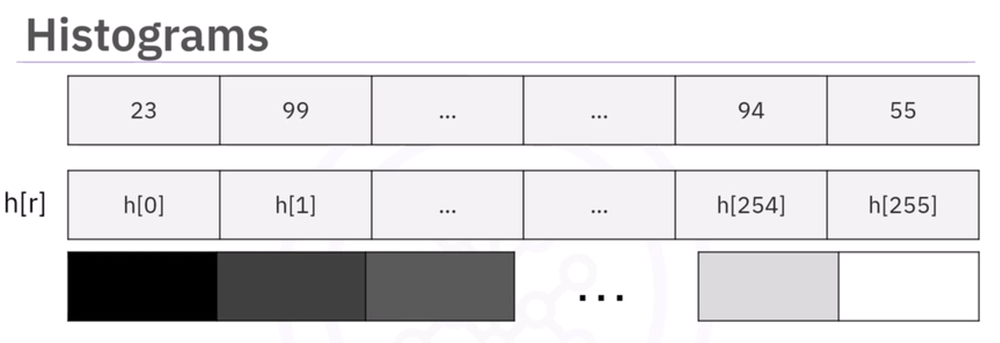

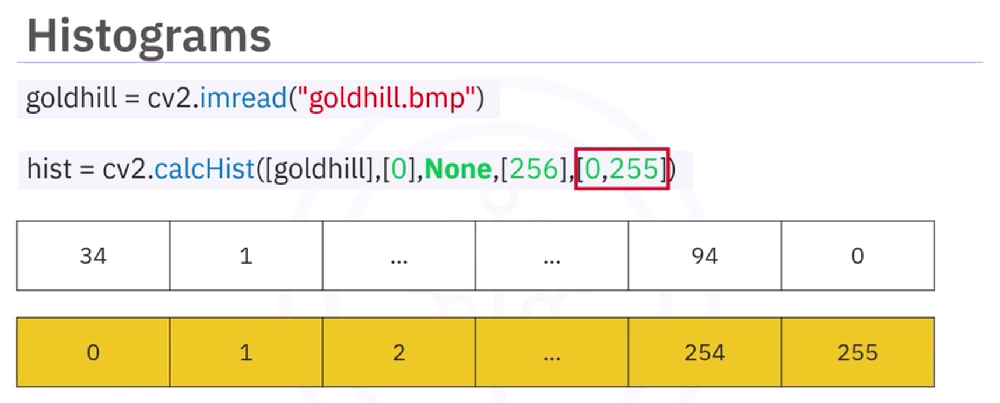

In [67]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os

In [79]:
direc = os.getcwd()
iname = "image2_vivi_rgb.png"
image = f"{direc}/Image_Storage/{iname}"
store = f"{direc}/Image_Storage/"

irgb = cv2.imread(image)
vivi = cv2.cvtColor(irgb, cv2.COLOR_BGR2GRAY) # Method 1 to transform RGB into Gray

In [76]:
vivi.shape

(736, 736)

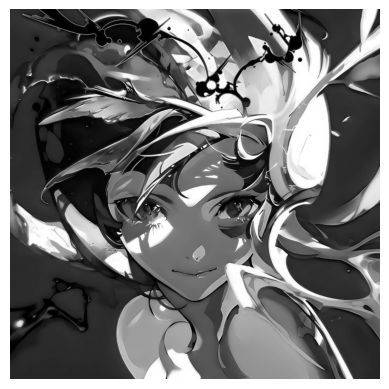

In [78]:
plt.imshow(vivi, cmap="gray", vmin=0, vmax=255)
plt.axis("off")
plt.show()

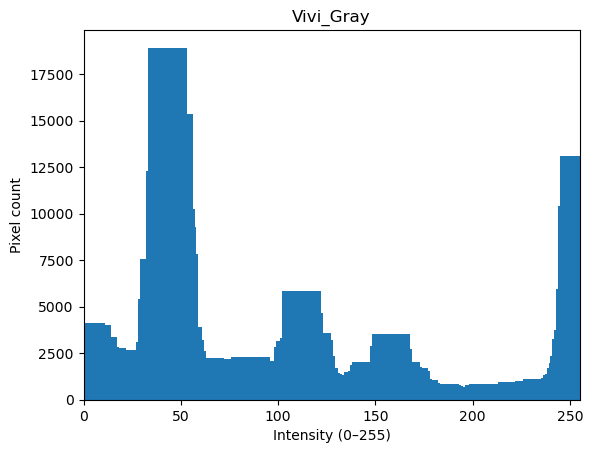

In [81]:
hist = cv2.calcHist([vivi], [0], None, [256], [0, 256]).flatten()

x = np.arange(256)
plt.bar(x, hist, width=20.0)
plt.title("Vivi_Gray")
plt.xlabel("Intensity (0–255)")
plt.ylabel("Pixel count")
plt.xlim(0, 255)
plt.show()

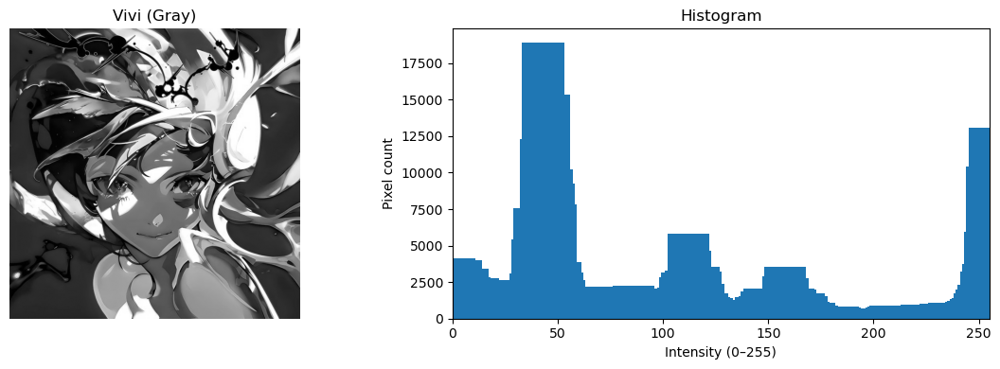

In [83]:
x = np.arange(256)

fig, ax = plt.subplots(1, 2, figsize=(12, 4))

# Left: image
ax[0].imshow(vivi, cmap="gray", vmin=0, vmax=255)
ax[0].set_title("Vivi (Gray)")
ax[0].axis("off")

# Right: histogram
ax[1].bar(x, hist, width=20.0)
ax[1].set_title("Histogram")
ax[1].set_xlabel("Intensity (0–255)")
ax[1].set_ylabel("Pixel count")
ax[1].set_xlim(0, 255)

plt.tight_layout()
plt.show()

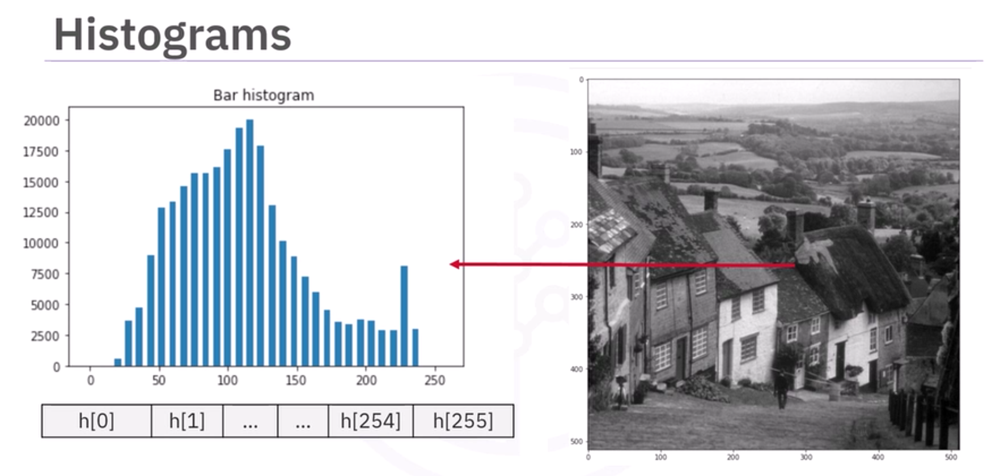

## **II./ Intensity Transformations**
#### **Definition:** InTr changes an image one pixel at a time. (Some image transformations depend on neighboring pixels)

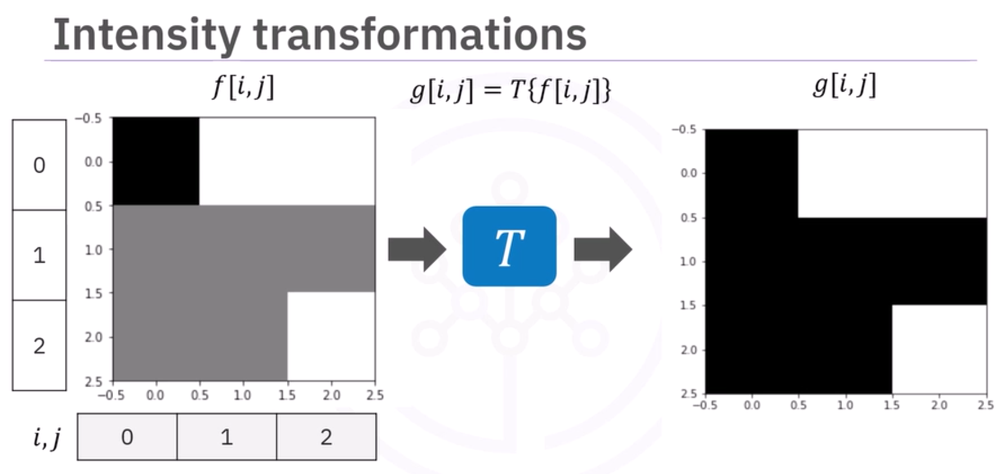
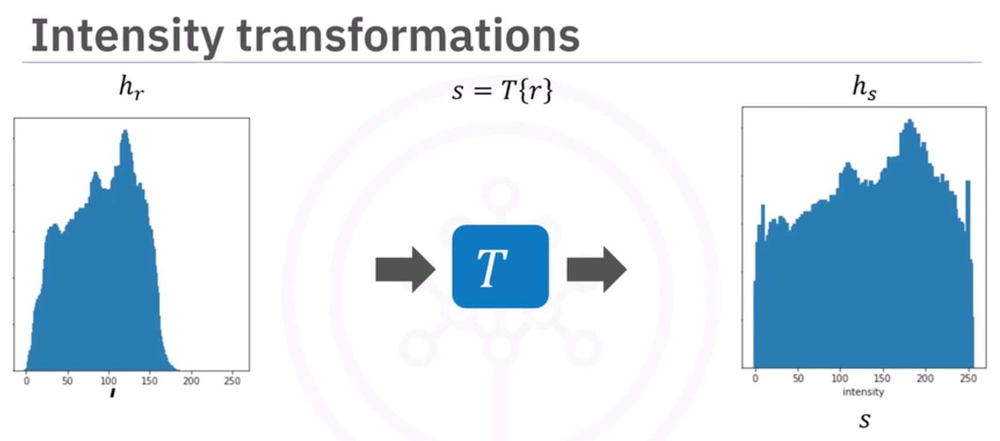
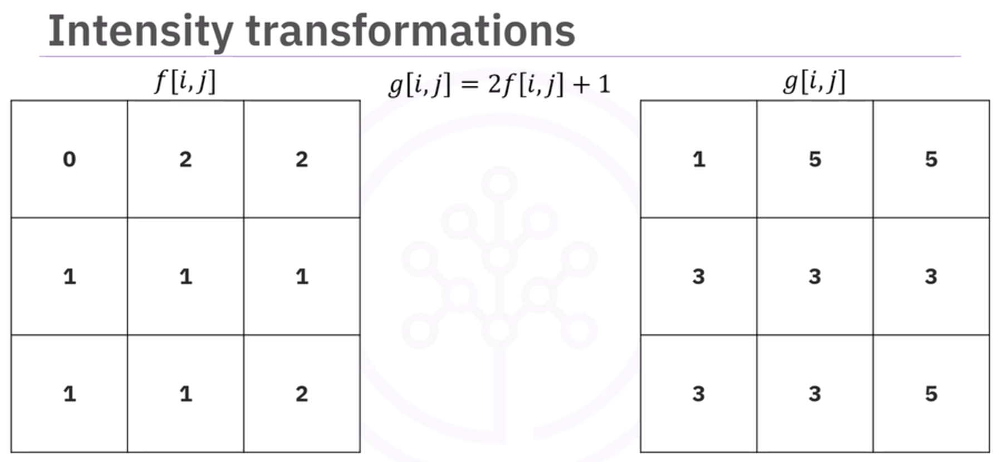
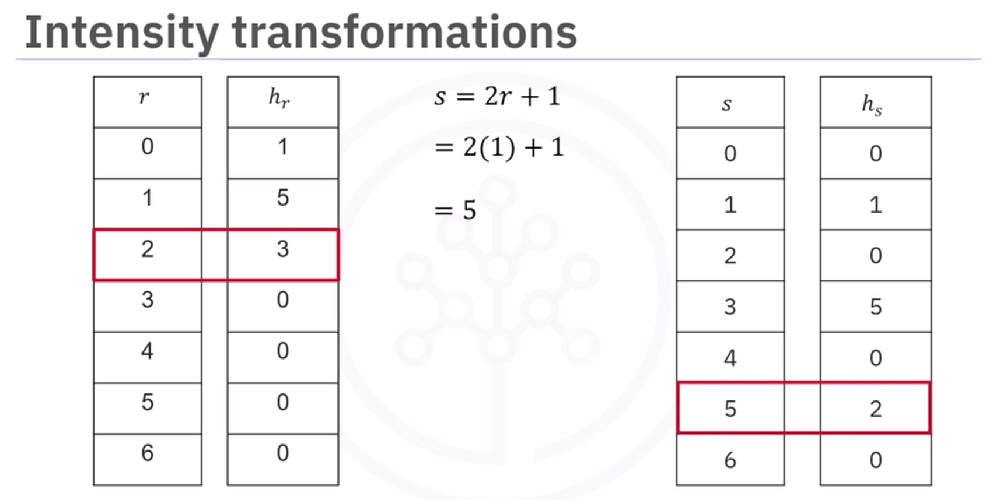
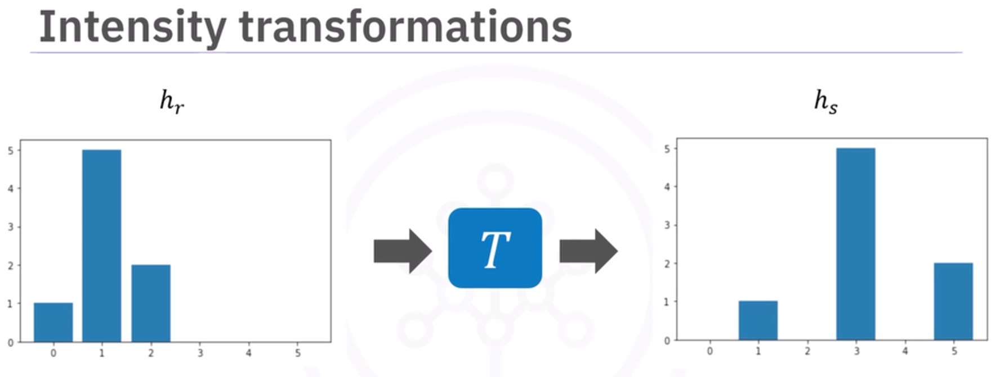

## **III./ Image Negatives**
#### **Definition:** ImNe is the process of reversing the intensity levels of an image.

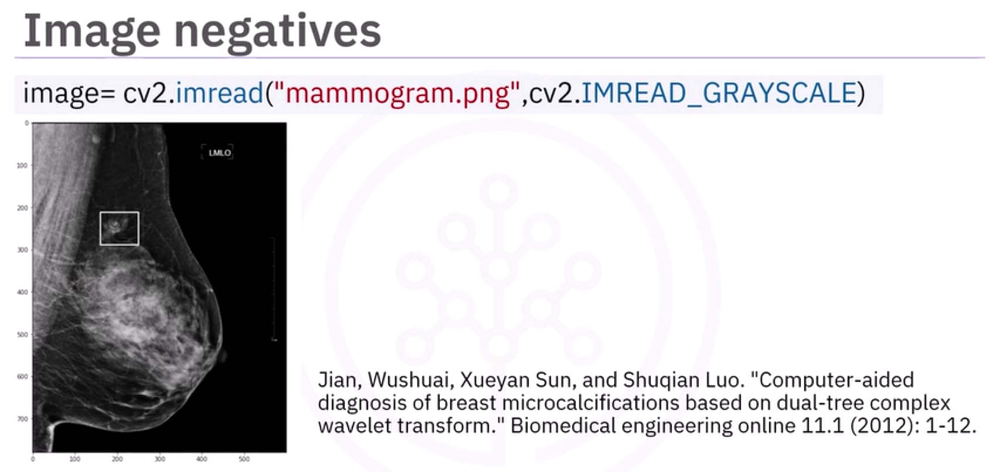
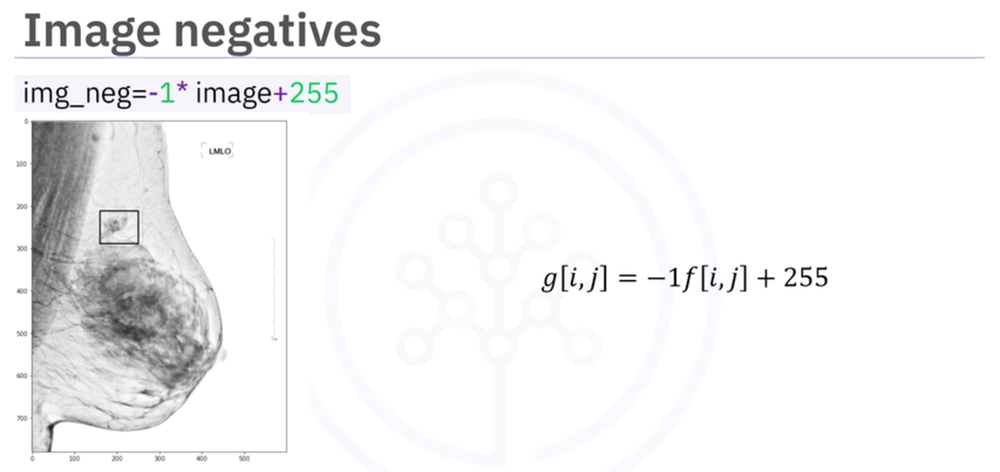
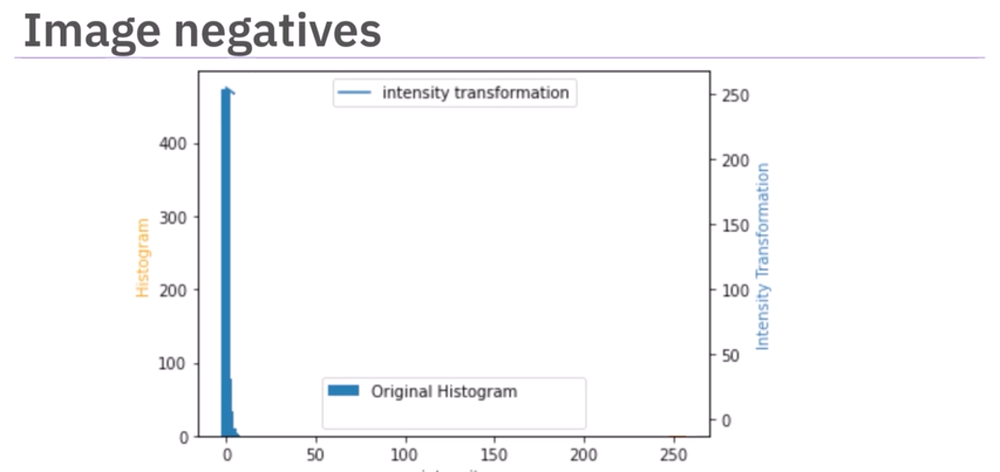
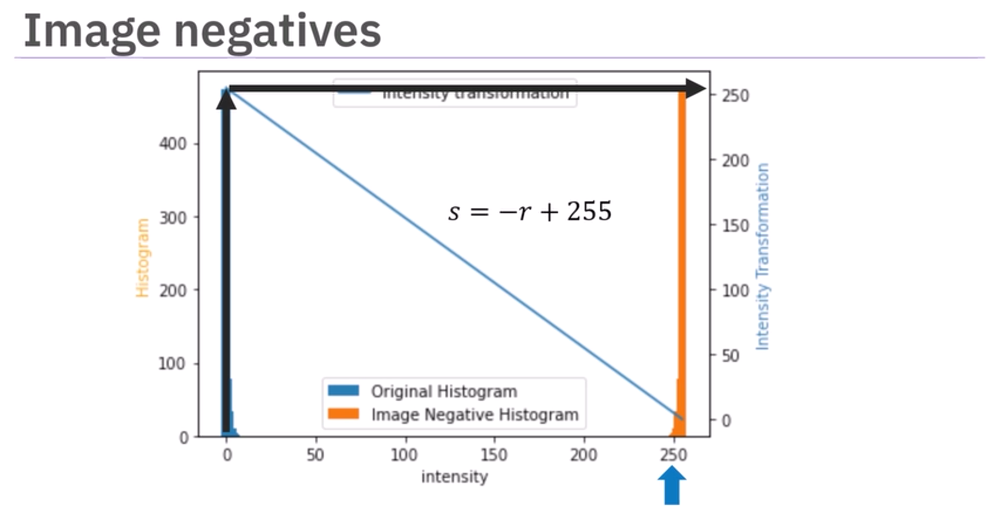

In [34]:
vivi_gray = cv2.imread("Image_Storage/image3_vivi_gray.jpg", cv2.IMREAD_GRAYSCALE)

In [35]:
vivi_gray.shape

(736, 736)

In [37]:
vivi_nega = 255 - vivi_gray

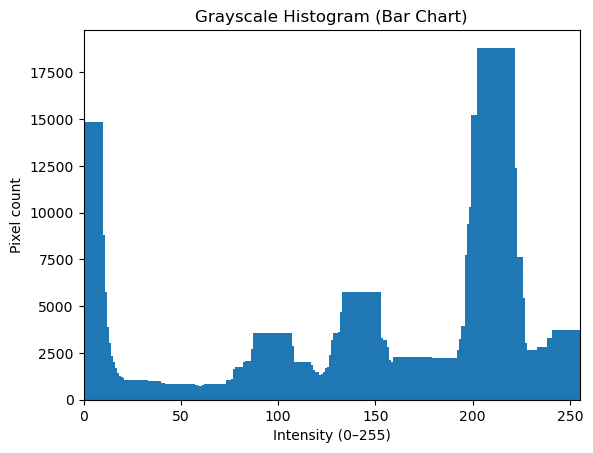

In [40]:
hist = cv2.calcHist([vivi_nega], [0], None, [256], [0, 256]).flatten()

x = np.arange(256)
plt.bar(x, hist, width=20.0)
plt.title("Grayscale Histogram (Bar Chart)")
plt.xlabel("Intensity (0–255)")
plt.ylabel("Pixel count")
plt.xlim(0, 255)
plt.show()

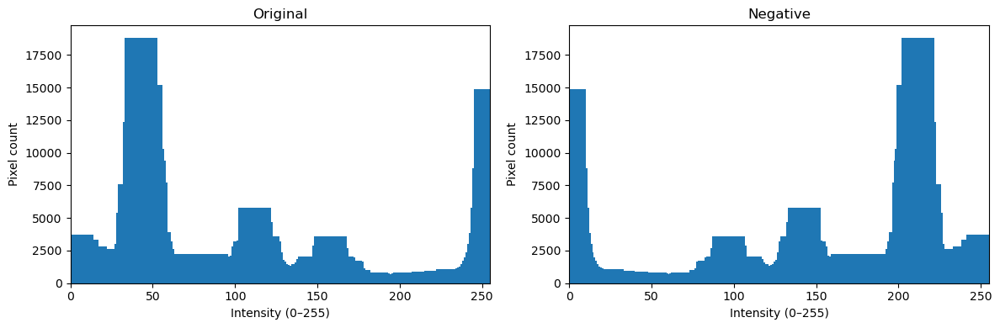

In [65]:
hist1 = cv2.calcHist([vivi_gray], [0], None, [256], [0, 256]).flatten()
hist2 = cv2.calcHist([vivi_nega], [0], None, [256], [0, 256]).flatten()
x = np.arange(256)

fig, ax = plt.subplots(1, 2, figsize=(12, 4))

ax[0].bar(x, hist1, width=20.0)
ax[0].set_title("Original")
ax[0].set_xlabel("Intensity (0–255)")
ax[0].set_ylabel("Pixel count")
ax[0].set_xlim(0, 255)

ax[1].bar(x, hist2, width=20.0)
ax[1].set_title("Negative")
ax[1].set_xlabel("Intensity (0–255)")
ax[1].set_ylabel("Pixel count")
ax[1].set_xlim(0, 255)

plt.tight_layout()
plt.show()

In [44]:
img1 = Image.open("Image_Storage/image3_vivi_gray.jpg")
img2 = Image.open("Image_Storage/image4_vivi_nega.jpg")

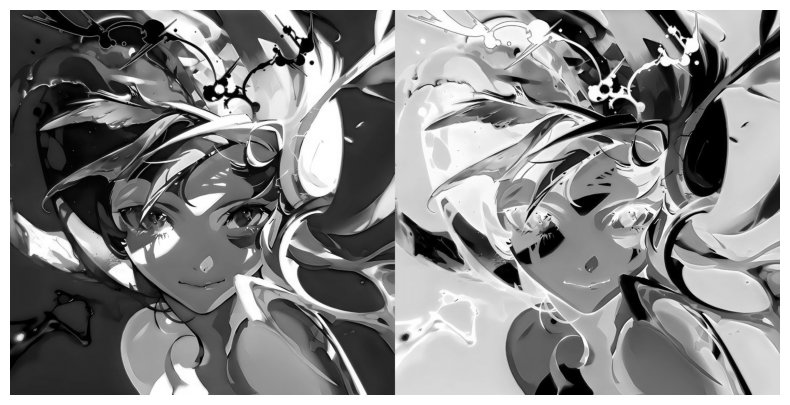

In [47]:
row = np.hstack([img1, img2])

plt.figure(figsize=(10, 5))
plt.imshow(row, cmap="gray", vmin=0, vmax=255)
plt.axis("off")
plt.show()

## **IV./ Brighness and Contrast Adjustments**
#### **Definition:** A linear transform can be seen as applying BaCA. 
#### Example: linear model, with alpha is simple constrast control, beta is simple brighness control.
#### converScaleAbs(): Rather than using array operations, using this function after applying the transformation. The function scales calculates absolute values so the intensity values fall in the 0 and 255 value range.

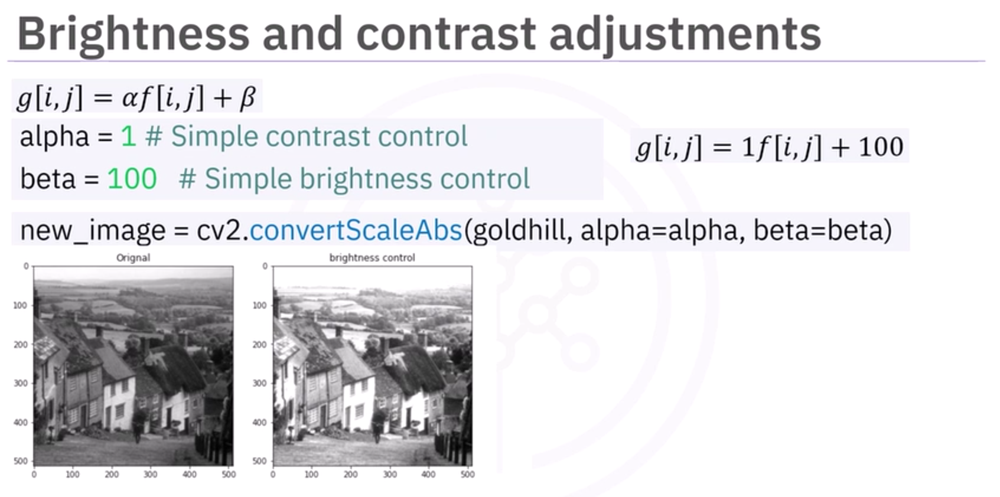
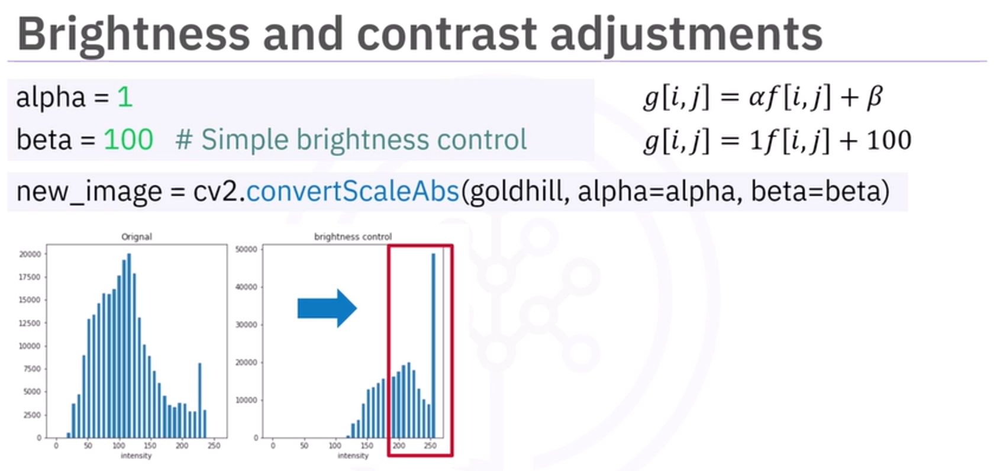
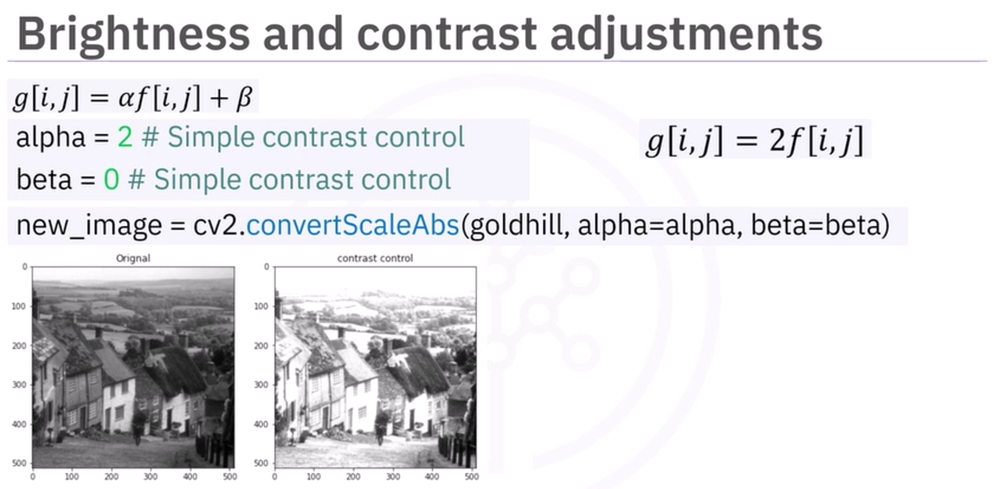
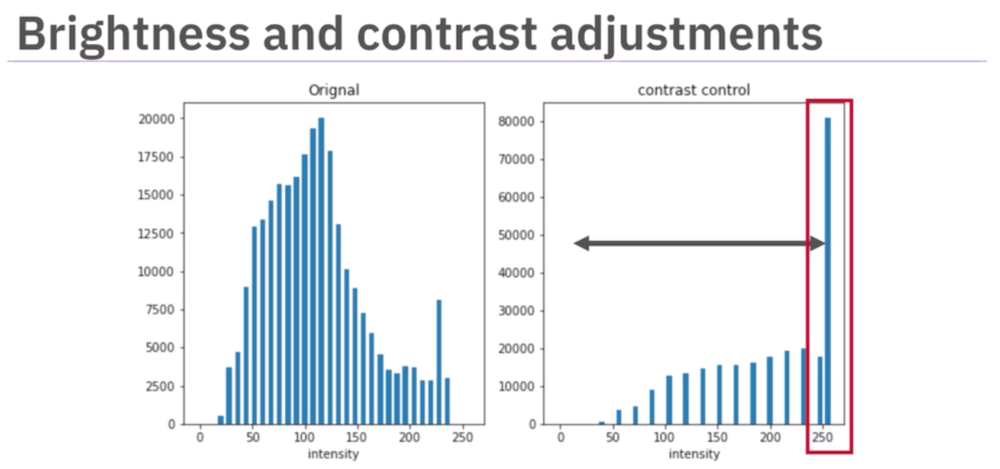

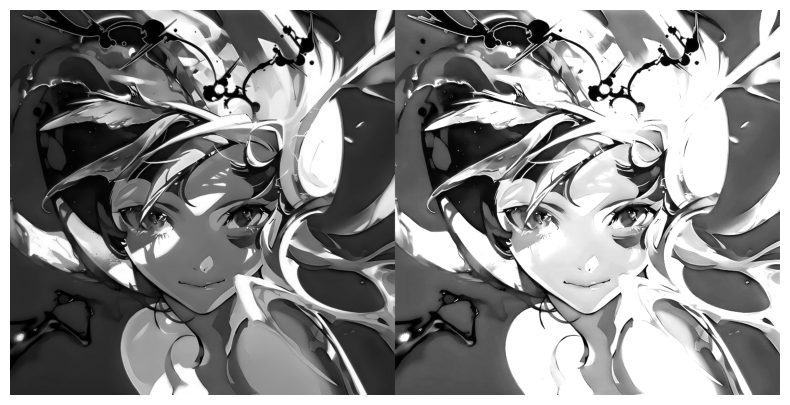

In [60]:
alpha = 2
beta = 0
vivi_abs = cv2.convertScaleAbs(vivi_gray, alpha=alpha, beta=beta)

row = np.hstack([vivi_gray, vivi_abs])

plt.figure(figsize=(10, 5))
plt.imshow(row, cmap="gray", vmin=0, vmax=255)
plt.axis("off")
plt.show()

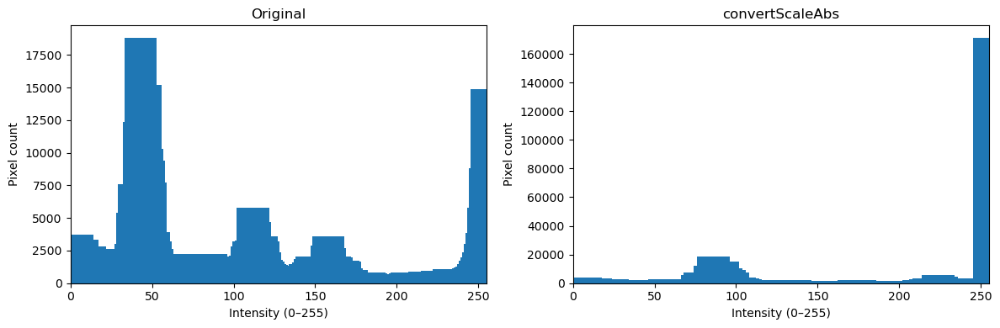

In [64]:
hist1 = cv2.calcHist([vivi_gray], [0], None, [256], [0, 256]).flatten()
hist2 = cv2.calcHist([vivi_abs], [0], None, [256], [0, 256]).flatten()
x = np.arange(256)

fig, ax = plt.subplots(1, 2, figsize=(12, 4))

ax[0].bar(x, hist1, width=20.0)
ax[0].set_title("Original")
ax[0].set_xlabel("Intensity (0–255)")
ax[0].set_ylabel("Pixel count")
ax[0].set_xlim(0, 255)

ax[1].bar(x, hist2, width=20.0)
ax[1].set_title("convertScaleAbs")
ax[1].set_xlabel("Intensity (0–255)")
ax[1].set_ylabel("Pixel count")
ax[1].set_xlim(0, 255)

plt.tight_layout()
plt.show()

#### **Takenote:** 
1. Adjust alpha to change the contrast
2. Problem: Darker places are improved, but lighter places are washed out
3. Solution: Using non-linear functions -> optimaze contrast

## **V./ Histogram Equalization**
#### **Definition:** HE is an algorithm that uses the image's histogram to adjust contrast.
#### equalizeHist(): This function improves contrast by using the histogram to determine a transform that flattens the histogram.

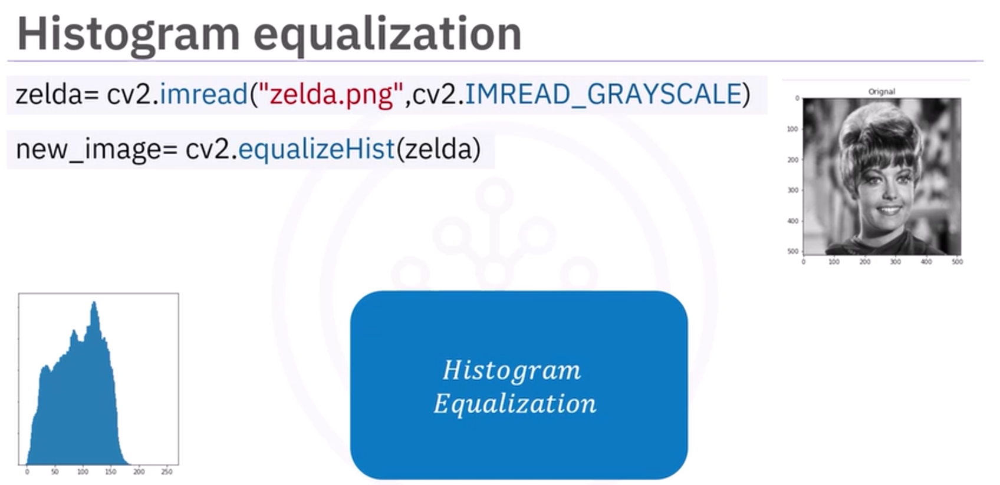
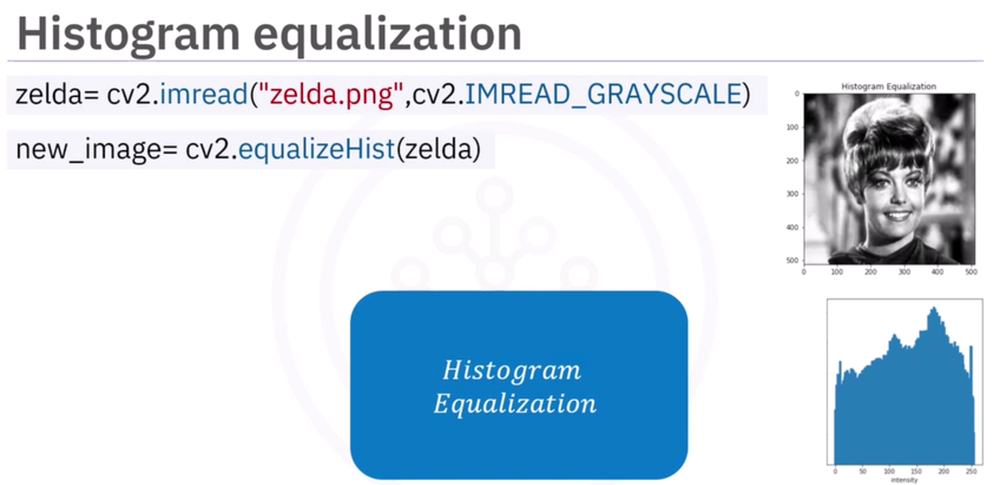

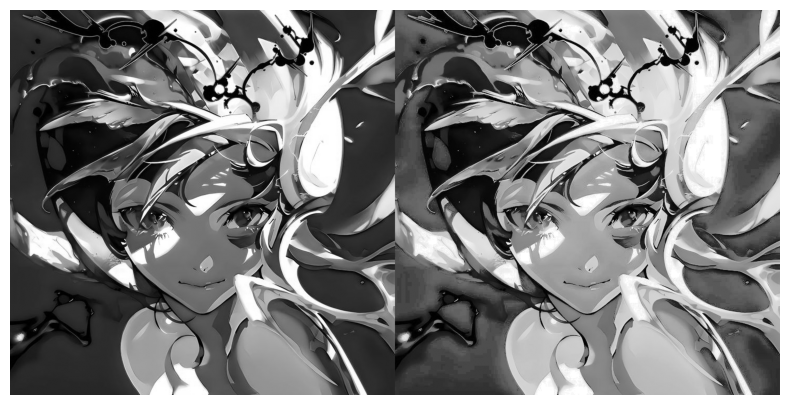

In [59]:
vivi_contrast = cv2.equalizeHist(vivi_gray)

row = np.hstack([vivi_gray, vivi_contrast])

plt.figure(figsize=(10, 5))
plt.imshow(row, cmap="gray", vmin=0, vmax=255)
plt.axis("off")
plt.show()

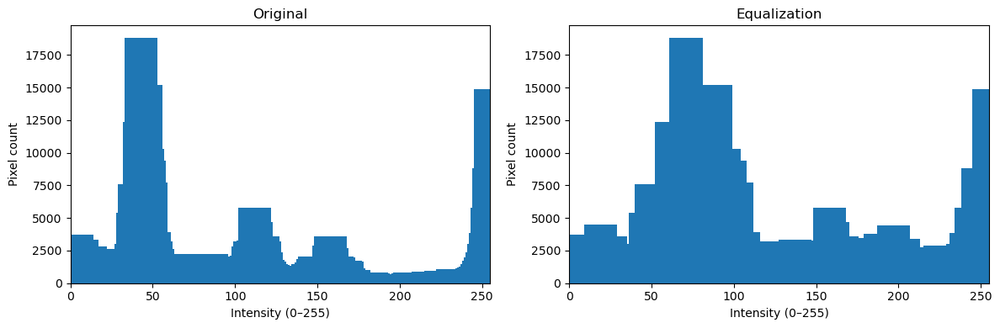

In [63]:
hist1 = cv2.calcHist([vivi_gray], [0], None, [256], [0, 256]).flatten()
hist2 = cv2.calcHist([vivi_contrast], [0], None, [256], [0, 256]).flatten()
x = np.arange(256)

fig, ax = plt.subplots(1, 2, figsize=(12, 4))

ax[0].bar(x, hist1, width=20.0)
ax[0].set_title("Original")
ax[0].set_xlabel("Intensity (0–255)")
ax[0].set_ylabel("Pixel count")
ax[0].set_xlim(0, 255)

ax[1].bar(x, hist2, width=20.0)
ax[1].set_title("Equalization")
ax[1].set_xlabel("Intensity (0–255)")
ax[1].set_ylabel("Pixel count")
ax[1].set_xlim(0, 255)

plt.tight_layout()
plt.show()

## **VI./ Thresholding and Simple Segmentation**
#### **Definition:** A threshold function applies a threshold to every pixel. It can be used in extracting objects from an image. This is called segmentation.

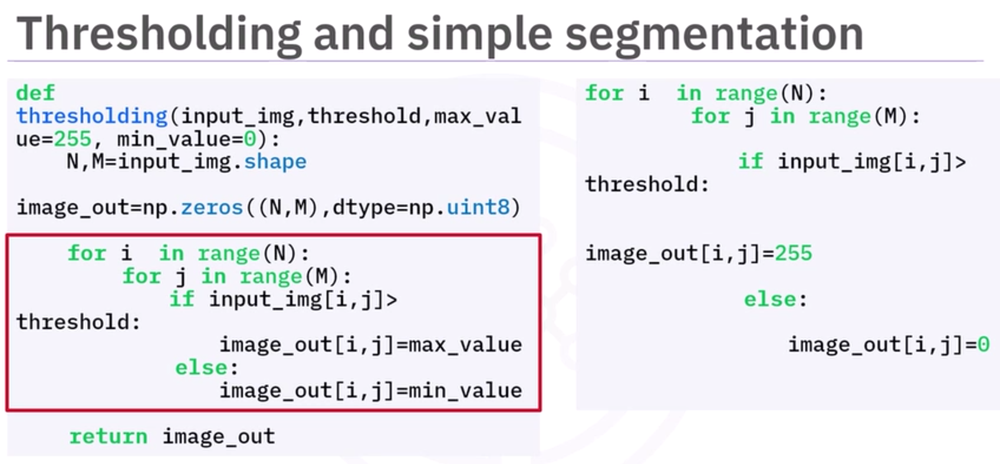

In [80]:
def thresholding(input_img, threshold, max_value = 255, min_value = 0):
    N, M = input_img.shape
    image_out = np.zeros((N,M), dtype=np.uint8)
    for i in range(N):
        for j in range(M):
            if input_img[i,j] > threshold:
                image_out[i,j] = max_value
            else:
                image_out[i,j] = min_value
    return image_out

### **Takenote:** 
1. The above function applies a threshold to the input array inputImageArrayInputOut and outputs the result.
2. The loop portion will cycle through each pixel, ij.
3. If conditions:
   * If the pixel is greater than the threshold, it will set a pixel in the array ImageOutPixel to some values, usually 1 or 255.
   * Else: it will set it to another value, usually 0.

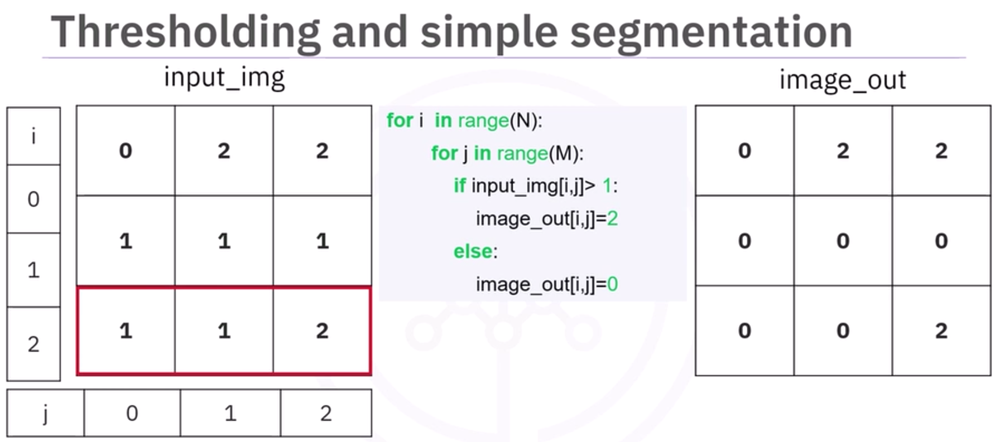
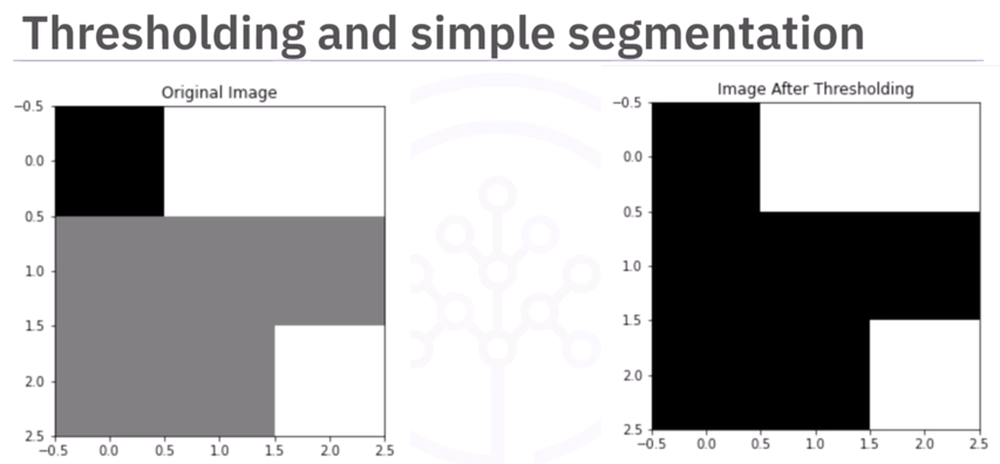

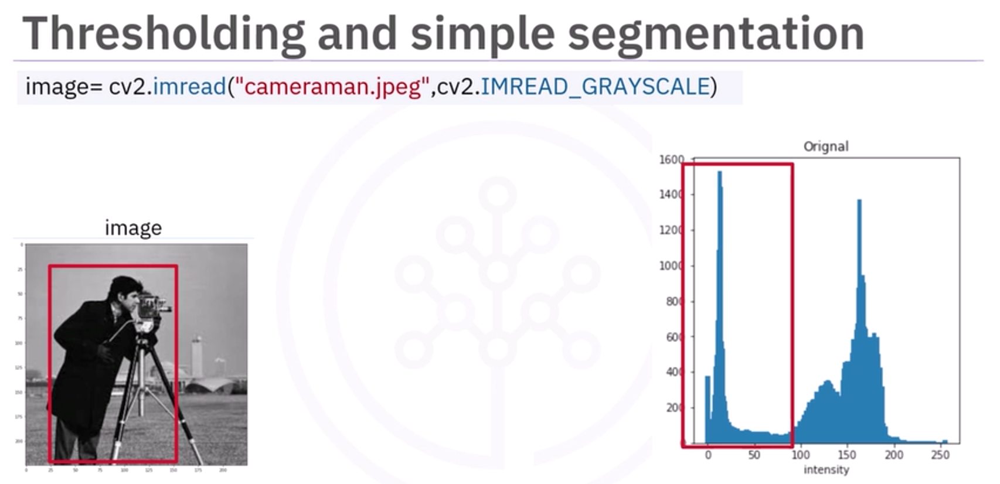
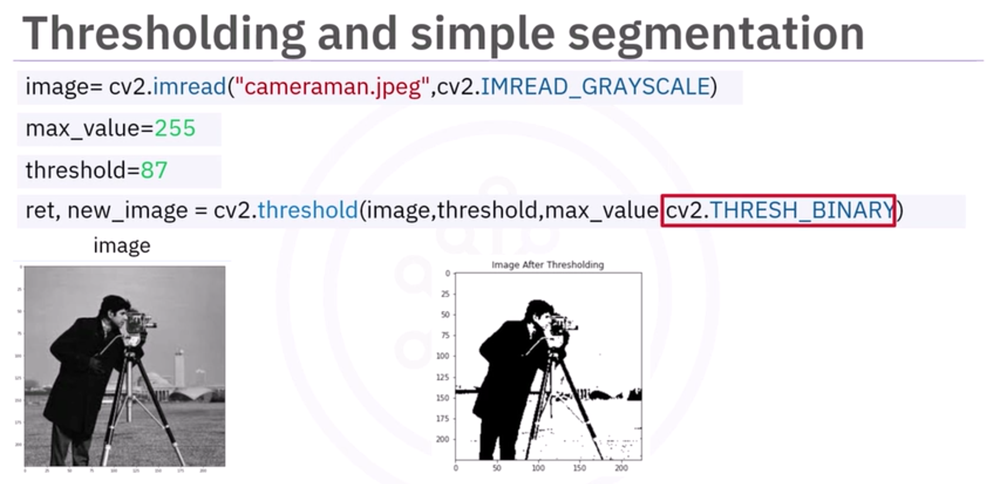
### cv2.THRESH_BINARY ["is the threshold type"], THRESH_BINARY: outputs 0 or 255.
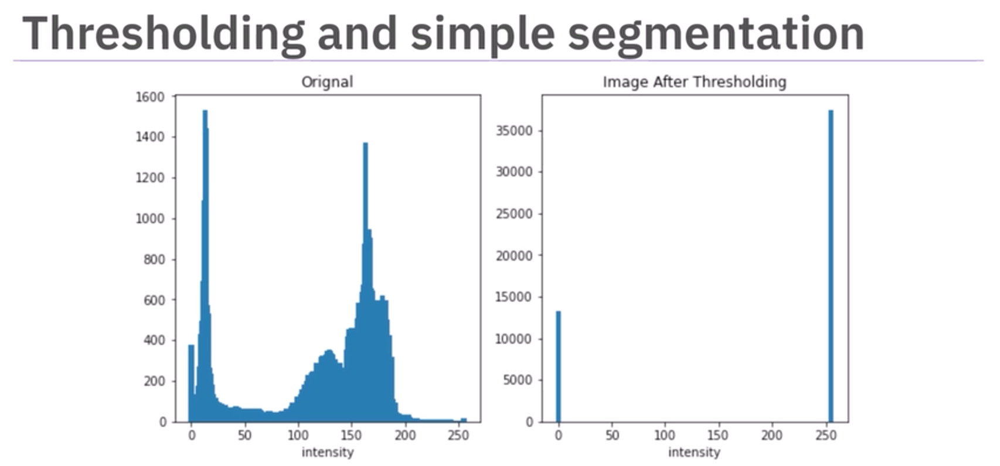

ret: 70.0


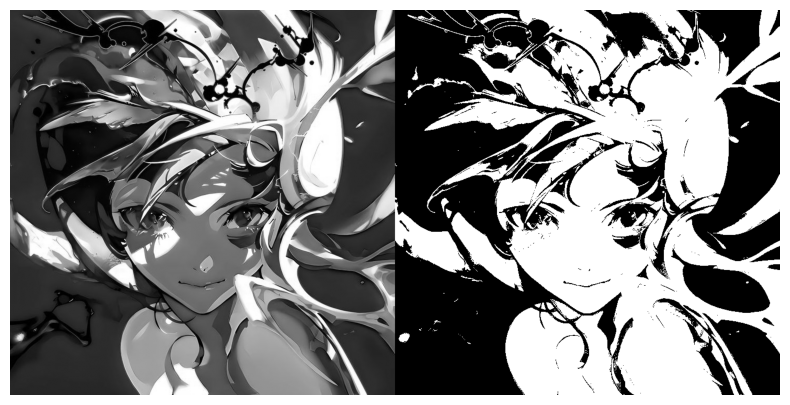

In [93]:
max_value = 255
threshold = 70 # Select manually

ret, vivi_seg = cv2.threshold(vivi_gray, threshold, max_value, cv2.THRESH_BINARY)

print(f"ret: {ret}")

row = np.hstack([vivi_gray, vivi_seg])

plt.figure(figsize=(10, 5))
plt.imshow(row, cmap="gray", vmin=0, vmax=255)
plt.axis("off")
plt.show()

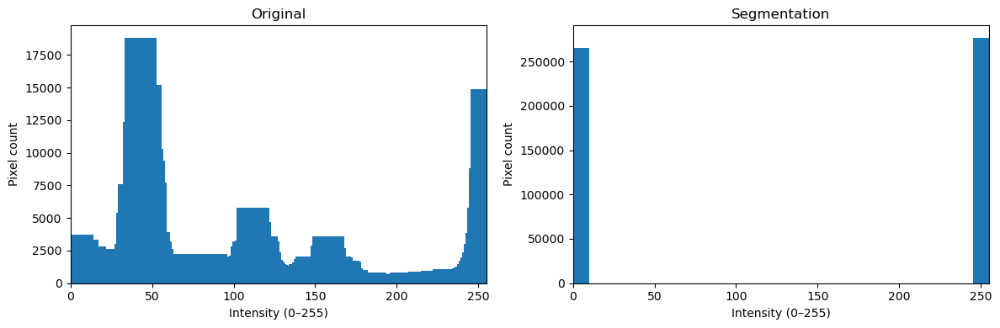

In [94]:
hist1 = cv2.calcHist([vivi_gray], [0], None, [256], [0, 256]).flatten()
hist2 = cv2.calcHist([vivi_seg], [0], None, [256], [0, 256]).flatten()
x = np.arange(256)

fig, ax = plt.subplots(1, 2, figsize=(12, 4))

ax[0].bar(x, hist1, width=20.0)
ax[0].set_title("Original")
ax[0].set_xlabel("Intensity (0–255)")
ax[0].set_ylabel("Pixel count")
ax[0].set_xlim(0, 255)

ax[1].bar(x, hist2, width=20.0)
ax[1].set_title("Segmentation")
ax[1].set_xlabel("Intensity (0–255)")
ax[1].set_ylabel("Pixel count")
ax[1].set_xlim(0, 255)

plt.tight_layout()
plt.show()

## **VII./ Selecting a threshold**
#### **Solution:** cv2.THRESH_OTSU: OTSU method is used to select the value automatically.

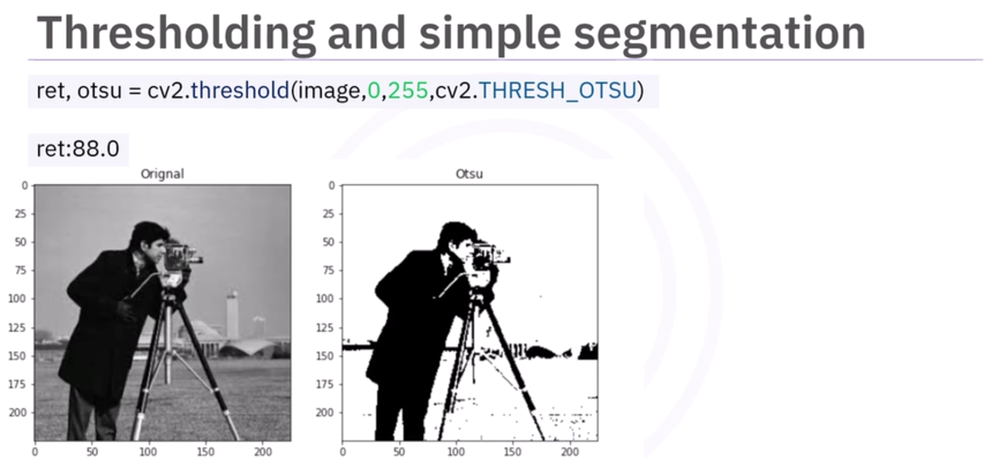

ret: 127.0


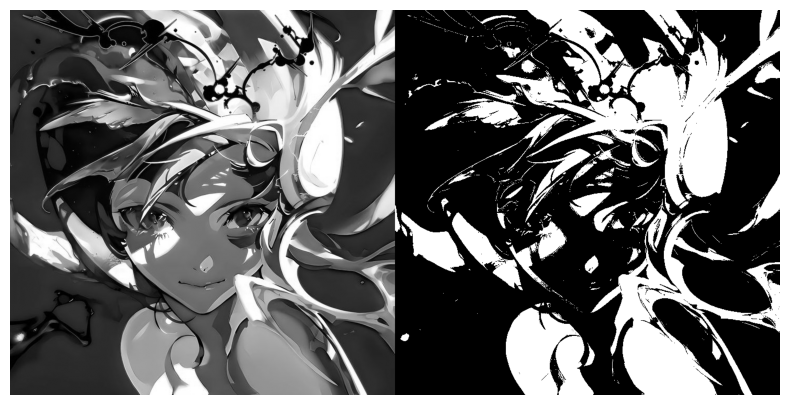

In [100]:
ret, vivi_otsu = cv2.threshold(vivi_gray, 0, max_value, cv2.THRESH_OTSU)

print(f"ret: {ret}")

row = np.hstack([vivi_gray, vivi_otsu])

plt.figure(figsize=(10, 5))
plt.imshow(row, cmap="gray", vmin=0, vmax=255)
plt.axis("off")
plt.show()

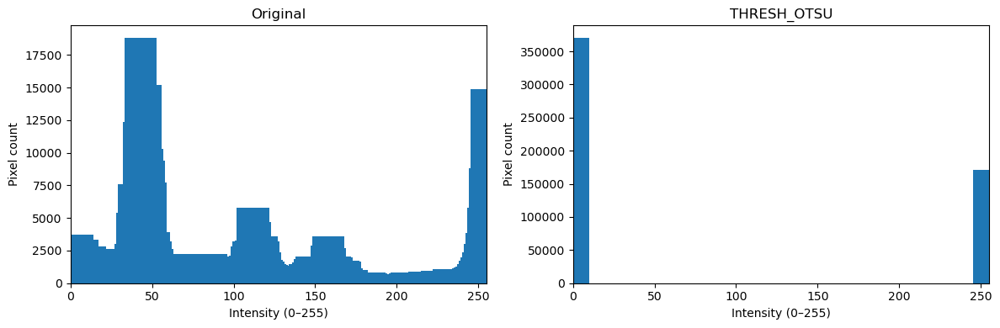

In [99]:
hist1 = cv2.calcHist([vivi_gray], [0], None, [256], [0, 256]).flatten()
hist2 = cv2.calcHist([vivi_otsu], [0], None, [256], [0, 256]).flatten()
x = np.arange(256)

fig, ax = plt.subplots(1, 2, figsize=(12, 4))

ax[0].bar(x, hist1, width=20.0)
ax[0].set_title("Original")
ax[0].set_xlabel("Intensity (0–255)")
ax[0].set_ylabel("Pixel count")
ax[0].set_xlim(0, 255)

ax[1].bar(x, hist2, width=20.0)
ax[1].set_title("THRESH_OTSU")
ax[1].set_xlabel("Intensity (0–255)")
ax[1].set_ylabel("Pixel count")
ax[1].set_xlim(0, 255)

plt.tight_layout()
plt.show()

## **VIII./ Testing Thresholding() function**

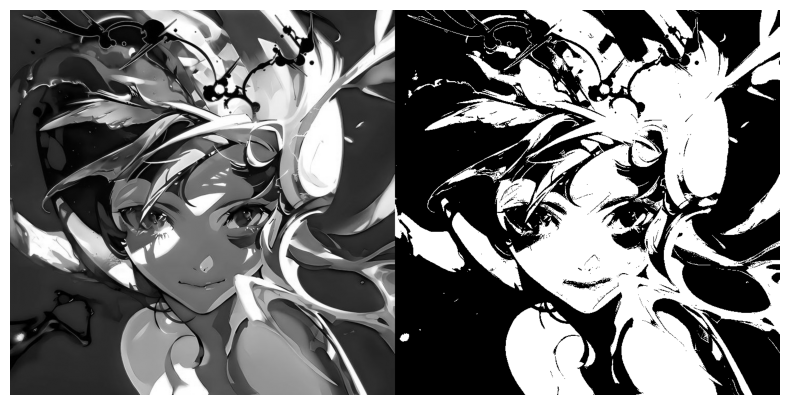

In [101]:
# input: thresholding(input_img, threshold, max_value = 255, min_value = 0)
# output: Image_out
threshold = 100
vivi_out = thresholding(vivi_gray, threshold)

row = np.hstack([vivi_gray, vivi_out])

plt.figure(figsize=(10, 5))
plt.imshow(row, cmap="gray", vmin=0, vmax=255)
plt.axis("off")
plt.show()

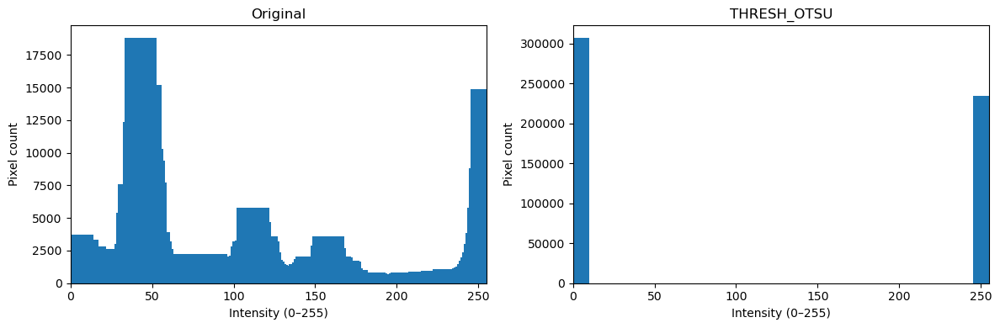

In [102]:
hist1 = cv2.calcHist([vivi_gray], [0], None, [256], [0, 256]).flatten()
hist2 = cv2.calcHist([vivi_out], [0], None, [256], [0, 256]).flatten()
x = np.arange(256)

fig, ax = plt.subplots(1, 2, figsize=(12, 4))

ax[0].bar(x, hist1, width=20.0)
ax[0].set_title("Original")
ax[0].set_xlabel("Intensity (0–255)")
ax[0].set_ylabel("Pixel count")
ax[0].set_xlim(0, 255)

ax[1].bar(x, hist2, width=20.0)
ax[1].set_title("THRESH_OTSU")
ax[1].set_xlabel("Intensity (0–255)")
ax[1].set_ylabel("Pixel count")
ax[1].set_xlim(0, 255)

plt.tight_layout()
plt.show()